# CFA CAPSTONE PROJECT

In [15]:
# Import key librares and modules 
import pandas as pd
import numpy as np

# Import datetime module that comes pre-installed in Python 
# datetime offers classes that work with date & time information
import datetime as dt

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px

from plotly.subplots import make_subplots
import plotly.graph_objects as go
# this command initializes Plotly in Jupyter Notebook 
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

# Cufflinks is a powerful Python library that connects Pandas and Plotly for generating plots using few lines of code
# Cufflinks allows for interactive data visualization
import cufflinks as cf
cf.go_offline() # Enabling offline mode for interactive data visualization locally

### We start off by analyzing the S&P500 index as well as visualizing the ticker data:

In [16]:
# S&P500 ticker Data from 1st Jan 2019 to 31st Dec 2023 (sourced from yfinance library)
snp_df=pd.read_csv("snp.csv")
print(snp_df)
print(snp_df.isnull().sum())
snp_df.info()

            Date         Open         High          Low        Close  \
0     2019-01-02  2476.959961  2519.489990  2467.469971  2510.030029   
1     2019-01-03  2491.919922  2493.139893  2443.959961  2447.889893   
2     2019-01-04  2474.330078  2538.070068  2474.330078  2531.939941   
3     2019-01-07  2535.610107  2566.159912  2524.560059  2549.689941   
4     2019-01-08  2568.110107  2579.820068  2547.560059  2574.409912   
...          ...          ...          ...          ...          ...   
1253  2023-12-22  4753.919922  4772.939941  4736.770020  4754.629883   
1254  2023-12-26  4758.859863  4784.720215  4758.450195  4774.750000   
1255  2023-12-27  4773.450195  4785.390137  4768.899902  4781.580078   
1256  2023-12-28  4786.439941  4793.299805  4780.979980  4783.350098   
1257  2023-12-29  4782.879883  4788.430176  4751.990234  4769.830078   

        Adj Close      Volume  
0     2510.030029  3733160000  
1     2447.889893  3858830000  
2     2531.939941  4234140000  
3     2

In [17]:
snp_df.iloc[6:]

,Date,Open,High,Low,Close,Adj Close,Volume
6,2019-01-10,2573.510010,2597.820068,2562.020020,2596.639893,2596.639893,3721300000
7,2019-01-11,2588.110107,2596.270020,2577.399902,2596.260010,2596.260010,3447460000
8,2019-01-14,2580.310059,2589.320068,2570.409912,2582.610107,2582.610107,3689370000
9,2019-01-15,2585.100098,2613.080078,2585.100098,2610.300049,2610.300049,3601180000
10,2019-01-16,2614.750000,2625.760010,2612.679932,2616.100098,2616.100098,3882180000
...,...,...,...,...,...,...,...
1253,2023-12-22,4753.919922,4772.939941,4736.770020,4754.629883,4754.629883,3046770000
1254,2023-12-26,4758.859863,4784.720215,4758.450195,4774.750000,4774.750000,2513910000
1255,2023-12-27,4773.450195,4785.390137,4768.899902,4781.580078,4781.580078,2748450000
1256,2023-12-28,4786.439941,4793.299805,4780.979980,4783.350098,4783.350098,2698860000


In [18]:
snp_df['Daily Return'] = snp_df['Adj Close'].pct_change(1) * 100
snp_df['Daily Return'].replace(np.nan, 0, inplace = True)
print(snp_df)
print(snp_df.describe())
print("max daily return is=",snp_df['Daily Return'].max())

            Date         Open         High          Low        Close  \
0     2019-01-02  2476.959961  2519.489990  2467.469971  2510.030029   
1     2019-01-03  2491.919922  2493.139893  2443.959961  2447.889893   
2     2019-01-04  2474.330078  2538.070068  2474.330078  2531.939941   
3     2019-01-07  2535.610107  2566.159912  2524.560059  2549.689941   
4     2019-01-08  2568.110107  2579.820068  2547.560059  2574.409912   
...          ...          ...          ...          ...          ...   
1253  2023-12-22  4753.919922  4772.939941  4736.770020  4754.629883   
1254  2023-12-26  4758.859863  4784.720215  4758.450195  4774.750000   
1255  2023-12-27  4773.450195  4785.390137  4768.899902  4781.580078   
1256  2023-12-28  4786.439941  4793.299805  4780.979980  4783.350098   
1257  2023-12-29  4782.879883  4788.430176  4751.990234  4769.830078   

        Adj Close      Volume  Daily Return  
0     2510.030029  3733160000      0.000000  
1     2447.889893  3858830000     -2.475673

In [19]:
import plotly.express as px
import pandas as pd

# Assuming you have already loaded the data and assigned it to snp_df

fig = px.line(title='S&P500 Adjusted Closing Price [$]')
fig.add_scatter(x=snp_df['Date'], y=snp_df['Adj Close'], name='Adj Close')
fig.show()


In [20]:
fig = px.line(title = 'S&P500 Adjusted Closing Price [$]')
fig.add_scatter(x = snp_df['Date'], y = snp_df['Adj Close'], name = 'Adj Close')
fig.show()

In [21]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_financial_data(df, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
        fig.update_traces(line_width = 2)
        fig.update_layout({'plot_bgcolor': "white"})

    fig.show()

In [22]:

# Plot a Line Plot Using Plotly Express
plot_financial_data(snp_df.drop(['Volume', 'Daily Return'], axis = 1), ' S&P500 Price [$]')
plot_financial_data(snp_df.iloc[:,[0,6]], ' S&P500 Trading Volume')
plot_financial_data(snp_df.iloc[:,[0,7]], ' S&P500 Percentage Daily Return [%]')

In [23]:
# Define a function that classifies the returns based on the magnitude
def percentage_return_classifier(percentage_return):
    
    if percentage_return > -0.3 and percentage_return <= 0.3:
        return 'Insignificant Change'
    elif percentage_return > 0.3 and percentage_return <= 3:
        return 'Positive Change'
    elif percentage_return > -3 and percentage_return <= -0.3:
        return 'Negative Change'
    elif percentage_return > 3 and percentage_return <= 7:
        return 'Large Positive Change'
    elif percentage_return > -7 and percentage_return <= -3:
        return 'Large Negative Change'
    elif percentage_return > 3:
        return 'Bull Run'
    elif percentage_return <= -3:
        return 'Bear Sell Off'

Trend
Positive Change          479
Insignificant Change     369
Negative Change          369
Large Negative Change     21
Large Positive Change     14
Bear Sell Off              3
Bull Run                   3
Name: count, dtype: int64


<Axes: ylabel='count'>

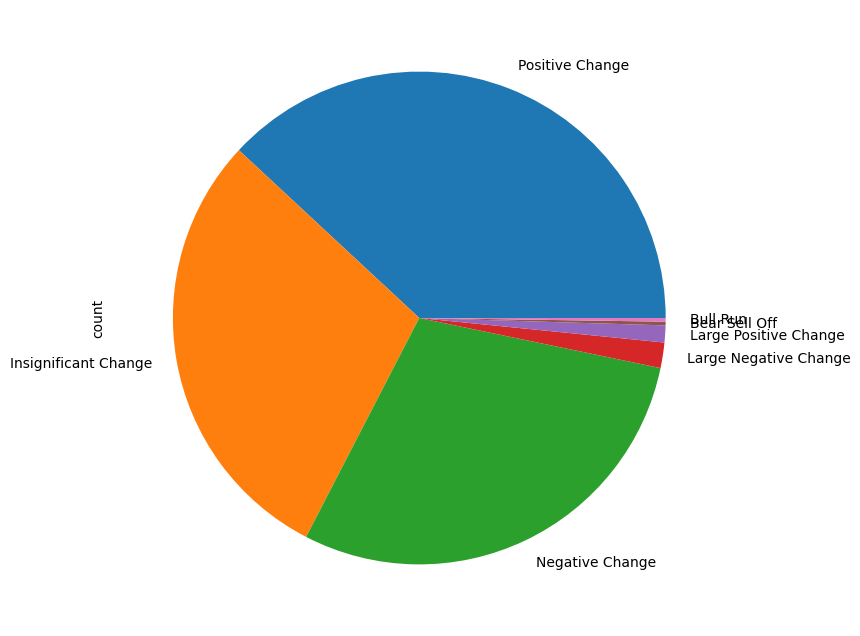

In [24]:
snp_df['Trend'] = snp_df['Daily Return'].apply(percentage_return_classifier)
trend_summary = snp_df['Trend'].value_counts()
print(trend_summary)
# Plot a pie chart using Matplotlib Library
plt.figure(figsize = (8, 8))
trend_summary.plot(kind = 'pie', y = 'Trend')

In [25]:
snp_df.set_index(['Date'], inplace = True)
# Plot Candlestick figure using Cufflinks QuantFig module
figure = cf.QuantFig(snp_df, title = 'S&P500 Candlestick Chart', name = 'S&P500')
figure.add_sma(periods =[14, 21], column = 'Close', color = ['magenta', 'green'])
figure.iplot(theme = 'white', up_color = 'green', down_color = 'red')

figure = cf.QuantFig(snp_df, title = 'S&P500 Candlestick Chart', name = 'S&P500')
figure.add_bollinger_bands(periods= 20, boll_std = 2,color = ['yellow', 'blue'])
figure.iplot(theme = 'white', up_color = 'green', down_color = 'red')


In [26]:
# Function to scale stock prices based on their initial starting price
# The objective of this function is to set all prices to start at a value of 1 
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
          scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

### Next, we create a portfolio of my favorite tech stocks in the US and provide various statistics as well as visualizations:

            Date        AAPL        AMZN       GBTC        GOOG        META  \
0     2019-01-02   39.480000   76.956497   4.620000   52.292500  135.679993   
1     2019-01-03   35.547501   75.014000   4.520000   50.803001  131.740005   
2     2019-01-04   37.064999   78.769501   4.530000   53.535500  137.949997   
3     2019-01-07   36.982498   81.475502   4.860000   53.419498  138.050003   
4     2019-01-08   37.687500   82.829002   4.960000   53.813999  142.529999   
...          ...         ...         ...        ...         ...         ...   
1253  2023-12-22  193.600006  153.419998  36.910000  142.720001  353.390015   
1254  2023-12-26  193.050003  153.410004  35.650002  142.820007  354.829987   
1255  2023-12-27  193.149994  153.339996  36.250000  141.440002  357.829987   
1256  2023-12-28  193.580002  153.380005  34.810001  141.279999  358.320007   
1257  2023-12-29  192.529999  151.940002  34.619999  140.929993  353.959991   

            NFLX        NVDA        TSLA        ^GS

c:\Users\adars\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



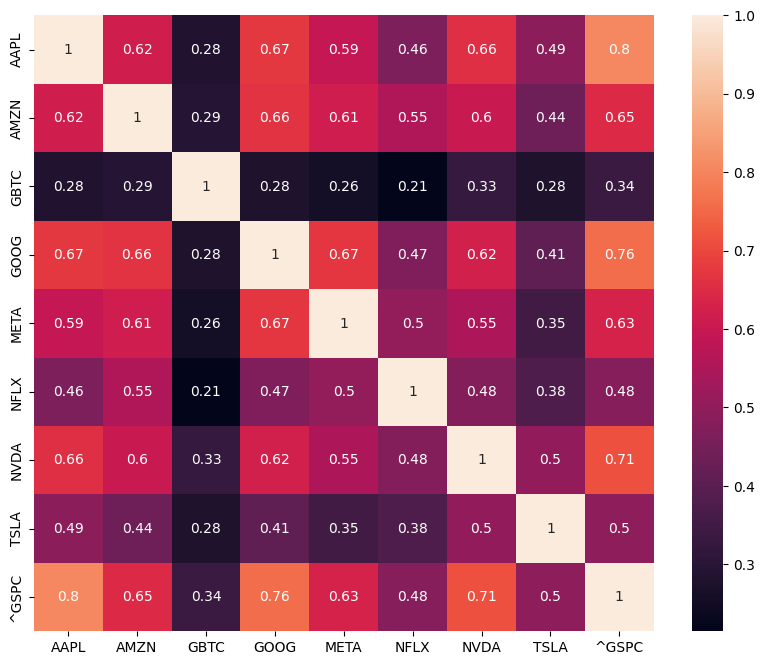

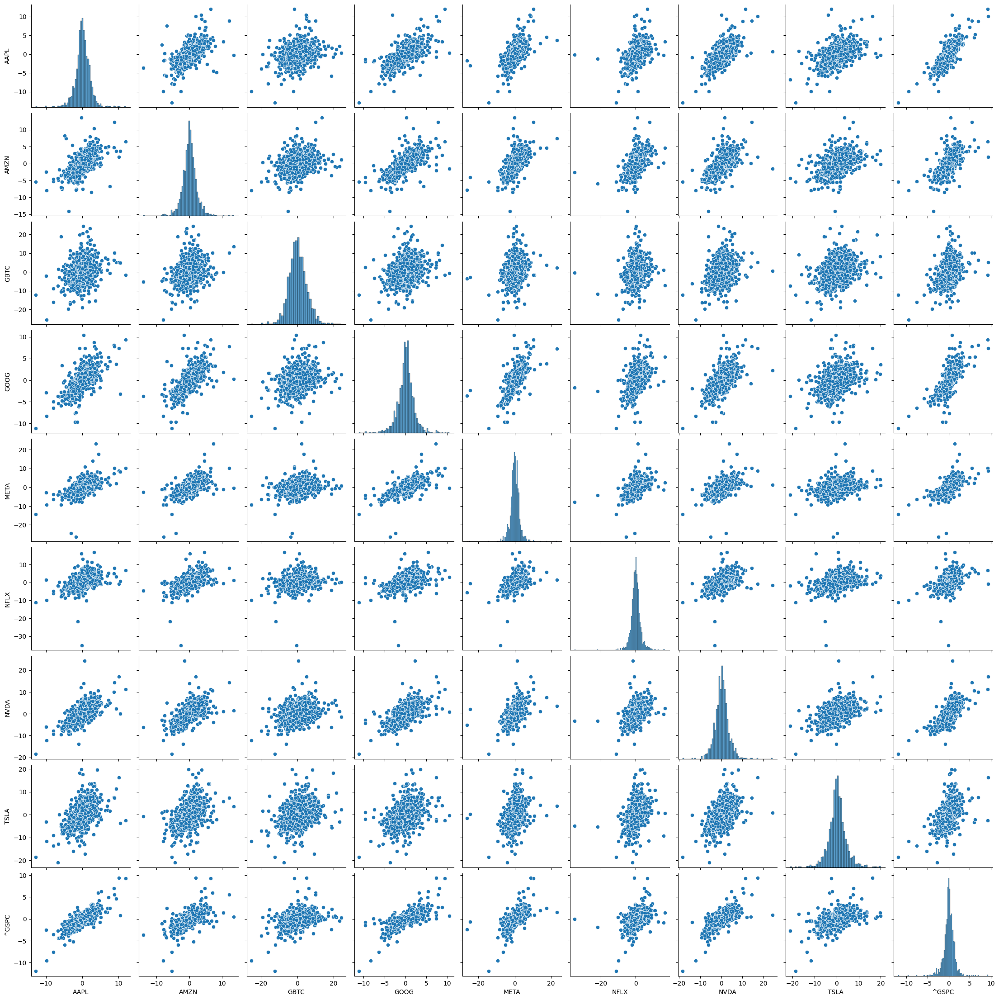

In [27]:
# AMZN: Amazon Inc. - Multinational tech company focusing on e-commerce, cloud computing, and artificial intelligence
# AAPL: Apple Inc. - Technology company known for its electronic devices.
# GBTC: Grayscale Bitcoin Trust - Investment trust for Bitcoin.
# NFLX: Netflix Inc. - Streaming platform for movies and TV shows.
# NVDA: NVIDIA Corporation - Technology company known for its graphics processing units.
# TSLA: Tesla Inc. - Electric vehicle and clean energy company.
# META: Meta Platforms, formerly named Facebook Inc. - META owns Facebook, Instagram, and WhatsApp
# GOOG: Google (Alphabet Inc.) - Multinational company that focuses on search engine tech, e-commerce, Cloud and AI 
# GSPC: S&P 500 Index - For reference as it is the most widely followed index.

close_price_df = pd.read_csv('closing_prices.csv')
print(close_price_df)

# The objective of this code cell is to calculate the percentage daily return
# We will perform this calculation on all stocks except for the first column which is "Date"
daily_returns_df = close_price_df.iloc[:, 1:].pct_change() * 100
daily_returns_df.replace(np.nan, 0, inplace = True)
print(daily_returns_df)

# Insert the date column at the start of the Pandas DataFrame (@ index = 0)
daily_returns_df.insert(0, "Date", close_price_df['Date'])
print(daily_returns_df)

# Plot closing prices using plotly Express. Note that we used the same pre-defined function "plot_financial_data"
plot_financial_data(close_price_df, 'Adjusted Closing Prices [$]')

#scaled closing prices 
plot_financial_data(price_scaling(close_price_df), 'SCALED PERFORMANCE')

# Plot the stocks daily returns
plot_financial_data(daily_returns_df, 'Percentage Daily Returns [%]')

# Plot histograms for stocks daily returns using plotly express

fig = px.histogram(daily_returns_df.drop(columns = ['Date']))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

# Plot a heatmap showing the correlations between daily returns

plt.figure(figsize = (10, 8))
sns.heatmap(daily_returns_df.drop(columns = ['Date']).corr(), annot = True)

# Plot the Pairplot between stocks daily returns
sns.pairplot(daily_returns_df)


We can see that GBTC(Bitcoin) returns are relatively uncorrelated with the rest of the assets, meanwhile AAPL and S&P500 show higher correlations which is expected as they represent the proxy of the US market as a whole. TSLA being the only auto manufacturer in the portfolio also shows relatively less correlation, however the portfolio is mostly made up of tech companies and hence the higher correlation is expected.

In [ ]:
close_price_df=close_price_df.drop(columns = ['^GSPC'])
close_price_df

,Date,AAPL,AMZN,GBTC,GOOG,META,NFLX,NVDA,TSLA
0,2019-01-02,39.480000,76.956497,4.620000,52.292500,135.679993,267.660004,34.055000,20.674667
1,2019-01-03,35.547501,75.014000,4.520000,50.803001,131.740005,271.200012,31.997499,20.024000
2,2019-01-04,37.064999,78.769501,4.530000,53.535500,137.949997,297.570007,34.047501,21.179333
3,2019-01-07,36.982498,81.475502,4.860000,53.419498,138.050003,315.339996,35.849998,22.330667
4,2019-01-08,37.687500,82.829002,4.960000,53.813999,142.529999,320.269989,34.957500,22.356667
...,...,...,...,...,...,...,...,...,...
1253,2023-12-22,193.600006,153.419998,36.910000,142.720001,353.390015,486.760010,488.299988,252.539993
1254,2023-12-26,193.050003,153.410004,35.650002,142.820007,354.829987,491.190002,492.790009,256.609985
1255,2023-12-27,193.149994,153.339996,36.250000,141.440002,357.829987,491.790009,494.170013,261.440002
1256,2023-12-28,193.580002,153.380005,34.810001,141.279999,358.320007,490.510010,495.220001,253.179993


In [ ]:
close_price_df=close_price_df.drop(columns = ['^GSPC'])
close_price_df


,Date,AAPL,AMZN,GBTC,GOOG,META,NFLX,NVDA,TSLA
0,2019-01-02,39.480000,76.956497,4.620000,52.292500,135.679993,267.660004,34.055000,20.674667
1,2019-01-03,35.547501,75.014000,4.520000,50.803001,131.740005,271.200012,31.997499,20.024000
2,2019-01-04,37.064999,78.769501,4.530000,53.535500,137.949997,297.570007,34.047501,21.179333
3,2019-01-07,36.982498,81.475502,4.860000,53.419498,138.050003,315.339996,35.849998,22.330667
4,2019-01-08,37.687500,82.829002,4.960000,53.813999,142.529999,320.269989,34.957500,22.356667
...,...,...,...,...,...,...,...,...,...
1253,2023-12-22,193.600006,153.419998,36.910000,142.720001,353.390015,486.760010,488.299988,252.539993
1254,2023-12-26,193.050003,153.410004,35.650002,142.820007,354.829987,491.190002,492.790009,256.609985
1255,2023-12-27,193.149994,153.339996,36.250000,141.440002,357.829987,491.790009,494.170013,261.440002
1256,2023-12-28,193.580002,153.380005,34.810001,141.279999,358.320007,490.510010,495.220001,253.179993


In [ ]:
close_price_df=close_price_df.drop(columns = ['^GSPC'])
close_price_df


,Date,AAPL,AMZN,GBTC,GOOG,META,NFLX,NVDA,TSLA
0,2019-01-02,39.480000,76.956497,4.620000,52.292500,135.679993,267.660004,34.055000,20.674667
1,2019-01-03,35.547501,75.014000,4.520000,50.803001,131.740005,271.200012,31.997499,20.024000
2,2019-01-04,37.064999,78.769501,4.530000,53.535500,137.949997,297.570007,34.047501,21.179333
3,2019-01-07,36.982498,81.475502,4.860000,53.419498,138.050003,315.339996,35.849998,22.330667
4,2019-01-08,37.687500,82.829002,4.960000,53.813999,142.529999,320.269989,34.957500,22.356667
...,...,...,...,...,...,...,...,...,...
1253,2023-12-22,193.600006,153.419998,36.910000,142.720001,353.390015,486.760010,488.299988,252.539993
1254,2023-12-26,193.050003,153.410004,35.650002,142.820007,354.829987,491.190002,492.790009,256.609985
1255,2023-12-27,193.149994,153.339996,36.250000,141.440002,357.829987,491.790009,494.170013,261.440002
1256,2023-12-28,193.580002,153.380005,34.810001,141.279999,358.320007,490.510010,495.220001,253.179993


In [28]:
close_price_df=close_price_df.drop(columns = ['^GSPC'])
close_price_df


,Date,AAPL,AMZN,GBTC,GOOG,META,NFLX,NVDA,TSLA
0,2019-01-02,39.480000,76.956497,4.620000,52.292500,135.679993,267.660004,34.055000,20.674667
1,2019-01-03,35.547501,75.014000,4.520000,50.803001,131.740005,271.200012,31.997499,20.024000
2,2019-01-04,37.064999,78.769501,4.530000,53.535500,137.949997,297.570007,34.047501,21.179333
3,2019-01-07,36.982498,81.475502,4.860000,53.419498,138.050003,315.339996,35.849998,22.330667
4,2019-01-08,37.687500,82.829002,4.960000,53.813999,142.529999,320.269989,34.957500,22.356667
...,...,...,...,...,...,...,...,...,...
1253,2023-12-22,193.600006,153.419998,36.910000,142.720001,353.390015,486.760010,488.299988,252.539993
1254,2023-12-26,193.050003,153.410004,35.650002,142.820007,354.829987,491.190002,492.790009,256.609985
1255,2023-12-27,193.149994,153.339996,36.250000,141.440002,357.829987,491.790009,494.170013,261.440002
1256,2023-12-28,193.580002,153.380005,34.810001,141.279999,358.320007,490.510010,495.220001,253.179993


In [29]:
# Let's create an array that holds random portfolio weights
# Note that portfolio weights must add up to 1 
import random

def generate_portfolio_weights(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
        
    # let's make the sum of all weights add up to 1
    weights = weights/np.sum(weights)
    return weights

In [30]:
# Assume that we have $1,000,000 that we would like to invest in one or more of the selected stocks
# Let's create a function that receives the following arguments: 
      # (1) Stocks closing prices
      # (2) Random weights 
      # (3) Initial investment amount
# The function will return a DataFrame that contains the following:
      # (1) Daily value (position) of each individual stock over the specified time period
      # (2) Total daily value of the portfolio 
      # (3) Percentage daily return 

def asset_allocation(df, weights, initial_investment):
    portfolio_df = df.copy()

    # Scale stock prices using the "price_scaling" function that we defined earlier (Make them all start at 1)
    scaled_df = price_scaling(df)
  
    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = scaled_df[stock] * weights[i] * initial_investment

    # Sum up all values and place the result in a new column titled "portfolio value [$]" 
    # Note that we excluded the date column from this calculation
    portfolio_df['Portfolio Value [$]'] = portfolio_df[portfolio_df != 'Date'].sum(axis = 1, numeric_only = True)
            
    # Calculate the portfolio percentage daily return and replace NaNs with zeros
    portfolio_df['Portfolio Daily Return [%]'] = portfolio_df['Portfolio Value [$]'].pct_change(1) * 100 
    portfolio_df.replace(np.nan, 0, inplace = True)
    
    return portfolio_df

### Assigning random weights to the stocks in the portfolio and seeing the results:

In [55]:
# Now let's put this code in a function and generate random weights
# Let's obtain the number of stocks under consideration (note that we ignored the "Date" column) 
n = len(close_price_df.columns)-1

# Let's generate random weights 
print('Number of stocks under consideration = {}'.format(n))
weights = generate_portfolio_weights(n).round(6)
print('Portfolio weights = {}'.format(weights))

# Let's test out the "asset_allocation" function
portfolio_df = asset_allocation(close_price_df, weights, 1000000)
print(portfolio_df.round(2))

# Plot the portfolio percentage daily return
plot_financial_data(portfolio_df[['Date', 'Portfolio Daily Return [%]']], 'Portfolio Percentage Daily Return [%]')

# Plot each stock position in our portfolio over time
# This graph shows how our initial investment in each individual stock grows over time
plot_financial_data(portfolio_df.drop(['Portfolio Value [$]', 'Portfolio Daily Return [%]'], axis = 1), 'Portfolio positions [$]')

# Plot the total daily value of the portfolio (sum of all positions)
plot_financial_data(portfolio_df[['Date', 'Portfolio Value [$]']], 'Total Portfolio Value [$]')

Number of stocks under consideration = 8
Portfolio weights = [0.04098  0.068316 0.200127 0.13599  0.197636 0.06617  0.094488 0.196293]
            Date       AAPL       AMZN        GBTC       GOOG       META  \
0     2019-01-02   40980.00   68316.00   200127.00  135990.00  197636.00   
1     2019-01-03   36898.09   66591.60   195795.25  132116.46  191896.88   
2     2019-01-04   38473.24   69925.44   196228.44  139222.50  200942.56   
3     2019-01-07   38387.61   72327.62   210523.22  138920.83  201088.24   
4     2019-01-08   39119.40   73529.15   214854.97  139946.76  207613.95   
...          ...        ...        ...         ...        ...        ...   
1253  2023-12-22  200955.63  136194.36  1598850.16  371152.52  514759.68   
1254  2023-12-26  200384.73  136185.48  1544270.14  371412.59  516857.19   
1255  2023-12-27  200488.52  136123.34  1570260.59  367823.80  521227.09   
1256  2023-12-28  200934.87  136158.85  1507883.40  367407.70  521940.87   
1257  2023-12-29  199844.97  

In [32]:
# Let's define the simulation engine function 
# The function receives: 
    # (1) portfolio weights
    # (2) initial investment amount
# The function performs asset allocation and calculates portfolio statistical metrics including Sharpe ratio
# The function returns: 
    # (1) Expected portfolio return 
    # (2) Expected volatility 
    # (3) Sharpe ratio 
    # (4) Return on investment 
    # (5) Final portfolio value in dollars


def simulation_engine(weights, initial_investment,rf=0.035):
    # Perform asset allocation using the random weights (sent as arguments to the function)
    portfolio_df = asset_allocation(close_price_df, weights, initial_investment)
  
    # Calculate the return on the investment 
    # Return on investment is calculated using the last final value of the portfolio compared to its initial value
    return_on_investment = ((portfolio_df['Portfolio Value [$]'][-1:] - 
                             portfolio_df['Portfolio Value [$]'][0])/ 
                             portfolio_df['Portfolio Value [$]'][0]) * 100
  
    # Daily change of every stock in the portfolio (Note that we dropped the date, portfolio daily worth and daily % returns) 
    portfolio_daily_return_df = portfolio_df.drop(columns = ['Date', 'Portfolio Value [$]', 'Portfolio Daily Return [%]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1) 
  
    # Portfolio Expected Return formula
    expected_portfolio_return = np.sum(weights * portfolio_daily_return_df.mean() ) * 252
  
    # Portfolio volatility (risk) formula
    # The risk of an asset is measured using the standard deviation which indicates the dispertion away from the mean
    # The risk of a portfolio is not a simple sum of the risks of the individual assets within the portfolio
    # Portfolio risk must consider correlations between assets within the portfolio which is indicated by the covariance 
    # The covariance determines the relationship between the movements of two random variables
    # When two stocks move together, they have a positive covariance when they move inversely, the have a negative covariance 

    covariance = portfolio_daily_return_df.cov() * 252 
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))

    # Calculate Sharpe ratio
    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility 
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]
  

In [33]:
# Let's test out the "simulation_engine" function and print out statistical metrics
# Define the initial investment amount
initial_investment = 1000000
portfolio_metrics = simulation_engine(weights, initial_investment)

print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))


Expected Portfolio Annual Return = 39.20%
Portfolio Standard Deviation (Volatility) = 33.47%
Sharpe Ratio = 1.07
Portfolio Final Value = $5955271.84
Return on Investment = 495.53%


For equal weights:

In [42]:
weights=np.array([0.1, 0.1 , 0.1, 0.1, 0.1, 0.1, 0.1, 0.1])
print('For equal weights')
eq_portfolio_metrics = simulation_engine(weights, initial_investment)
print('Expected Portfolio Annual Return = {:.2f}%'.format(eq_portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(eq_portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(eq_portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(eq_portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(eq_portfolio_metrics[4]))


For equal weights
Expected Portfolio Annual Return = 34.47%
Portfolio Standard Deviation (Volatility) = 27.43%
Sharpe Ratio = 1.13
Portfolio Final Value = $4802770.08
Return on Investment = 500.35%


### Monte Carlo Simulation and Markowitz Efficient Frontier:

In [49]:
# Set the number of simulation runs
sim_runs = 10000
initial_investment = 1000000

# Placeholder to store all weights
weights_runs = np.zeros((sim_runs, n))

# Placeholder to store all Sharpe ratios
sharpe_ratio_runs = np.zeros(sim_runs)

# Placeholder to store all expected returns
expected_portfolio_returns_runs = np.zeros(sim_runs)

# Placeholder to store all volatility values
volatility_runs = np.zeros(sim_runs)

# Placeholder to store all returns on investment
return_on_investment_runs = np.zeros(sim_runs)

# Placeholder to store all final portfolio values
final_value_runs = np.zeros(sim_runs)

for i in range(sim_runs):
    # Generate random weights 
    weights = generate_portfolio_weights(n)
    # Store the weights
    weights_runs[i,:] = weights
    
    # Call "simulation_engine" function and store Sharpe ratio, return and volatility
    # Note that asset allocation is performed using the "asset_allocation" function  
    expected_portfolio_returns_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_value_runs[i], return_on_investment_runs[i] = simulation_engine(weights, initial_investment)
    print("Simulation Run = {}".format(i))   
    print("Weights = {}, Final Value = ${:.2f}, Sharpe Ratio = {:.2f}".format(weights_runs[i].round(3), final_value_runs[i], sharpe_ratio_runs[i]))   
    print('\n')

Simulation Run = 0
Weights = [0.015 0.175 0.141 0.054 0.171 0.161 0.112 0.171], Final Value = $6043641.28, Sharpe Ratio = 1.11


Simulation Run = 1
Weights = [0.203 0.14  0.028 0.135 0.154 0.133 0.205 0.002], Final Value = $5491261.61, Sharpe Ratio = 1.03


Simulation Run = 2
Weights = [0.043 0.142 0.063 0.231 0.232 0.226 0.057 0.006], Final Value = $3497505.68, Sharpe Ratio = 0.85


Simulation Run = 3
Weights = [0.116 0.212 0.135 0.035 0.134 0.146 0.131 0.091], Final Value = $5696939.36, Sharpe Ratio = 1.11


Simulation Run = 4
Weights = [0.148 0.003 0.107 0.178 0.164 0.132 0.157 0.112], Final Value = $6298695.72, Sharpe Ratio = 1.18


Simulation Run = 5
Weights = [0.056 0.035 0.204 0.012 0.227 0.197 0.048 0.221], Final Value = $6212728.34, Sharpe Ratio = 1.14


Simulation Run = 6
Weights = [0.187 0.033 0.046 0.202 0.168 0.105 0.049 0.21 ], Final Value = $5734041.58, Sharpe Ratio = 1.12


Simulation Run = 7
Weights = [0.152 0.218 0.031 0.278 0.134 0.069 0.02  0.098], Final Value = $40

In [50]:
print(sharpe_ratio_runs.min())
print(sharpe_ratio_runs.max())

0.6901863567870257
1.3543672345021618


In [51]:
# Obtain the portfolio weights that correspond to the maximum Sharpe ratio (Golden set of weights!)
print(weights_runs[sharpe_ratio_runs.argmax(), :])
# Return Sharpe ratio, volatility corresponding to the best weights allocation (maximum Sharpe ratio)
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weights_runs[sharpe_ratio_runs.argmax(), :], initial_investment)
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print('  - Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return * 100))
print('  - Portfolio Standard Deviation (Volatility) = {:.02f}%'.format(optimal_volatility * 100))
print('  - Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print('  - Final Value = ${:.02f}'.format(highest_final_value))
print('  - Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

[0.17935317 0.00050249 0.14529559 0.0164776  0.06215098 0.04378193
 0.29192536 0.26051288]
Best Portfolio Metrics Based on 10000 Monte Carlo Simulation Runs:
  - Portfolio Expected Annual Return = 58.50%
  - Portfolio Standard Deviation (Volatility) = 40.61%
  - Sharpe Ratio = 1.35
  - Final Value = $9626698.78
  - Return on Investment = 862.67%


In [52]:
# Create a DataFrame that contains volatility, return, and Sharpe ratio for all simualation runs
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 'Portfolio_Return': expected_portfolio_returns_runs.tolist(), 'Sharpe_Ratio': sharpe_ratio_runs.tolist() })
print(sim_out_df)

      Volatility  Portfolio_Return  Sharpe_Ratio
0       0.363428          0.439646      1.113413
1       0.326795          0.371007      1.028189
2       0.324222          0.309286      0.845983
3       0.345358          0.416682      1.105178
4       0.343003          0.439828      1.180249
...          ...               ...           ...
9995    0.326223          0.376149      1.045752
9996    0.361939          0.440990      1.121710
9997    0.382083          0.502081      1.222459
9998    0.335625          0.394579      1.071373
9999    0.340334          0.370220      0.984971

[10000 rows x 3 columns]


In [53]:
# Let's highlight the point with the highest Sharpe ratio
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )
fig.add_trace(go.Scatter(x = [optimal_volatility], y = [optimal_portfolio_return], mode = 'markers', name = 'Optimal Point', marker = dict(size=[40], color = 'red')))
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick = 5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

### We created the optimum portfolio with a max sharpe ratio of 1.35 an ROI of 862.67% with an Expected Annual Return of 58.50%
### The weights for this portfolio are: 18% *AAPL*, 14% *GBTC*, 1.6% *GOOG*, 6.2% *META*, 4.4% *NFLX*, 29% *NVDA*, 26% *TSLA*
### Volatility is 40.61%, making it suitable only for the aggressive risk seeking investors

In [54]:
# Plot interactive plot for volatility
fig = px.line(sim_out_df, y = 'Volatility')
fig.show()

# Plot interactive plot for Portfolio Return
fig = px.line(sim_out_df, y = 'Portfolio_Return')
fig.update_traces(line_color = 'red')
fig.show()


# Plot interactive plot for Portfolio Return
fig = px.line(sim_out_df, y = 'Sharpe_Ratio')
fig.update_traces(line_color = 'purple')
fig.show()